# Modelo Proposto no Curso - (I)

## Modelo do Detector de Emoções

### Importando Bibliotecas

In [ ]:
import cv2
import numpy as np
import pandas as pd
from google.colab.patches import cv2_imshow
import zipfile

In [ ]:
#!pip install tensorflow==2.17.0
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array
tf.__version__

'2.18.0'

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
path = "/content/gdrive/MyDrive/LAMIA/Material.zip"
zip_object = zipfile.ZipFile(file = path, mode = "r")
zip_object.extractall('./')
zip_object.close()

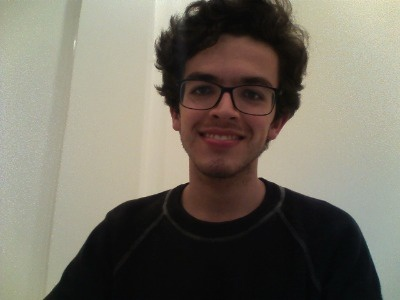

In [ ]:
# Carregar a imagem
imagem = cv2.imread('Material/testes/teste_gabriel.png')
if imagem is None:
    raise ValueError("Erro ao carregar a imagem. Verifique o caminho.")
else:
    cv2_imshow(imagem)

In [ ]:
cascade_faces = "Material/haarcascade_frontalface_default.xml"
caminho_modelo = "Material/modelo_01_expressoes.h5"
face_detection = cv2.CascadeClassifier(cascade_faces)

classificador_emocoes = tf.keras.models.load_model(caminho_modelo, compile=False)

expressoes = ["Raiva", "Nojo", "Medo", "Feliz", "Triste", "Surpreso", "Neutro"]

print("Resumo do modelo:")
classificador_emocoes.summary()

Erro ao carregar o modelo: Kernel shape must have the same length as input, but received kernel of shape (3, 3, 1, 64) and input of shape (None, None, 48, 48, 1).


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


ValueError: Kernel shape must have the same length as input, but received kernel of shape (3, 3, 1, 64) and input of shape (None, None, 48, 48, 1).

### Detecção de faces

In [ ]:
original = imagem.copy()
faces = face_detection.detectMultiScale(original, scaleFactor = 1.1,
                                        minNeighbors = 3, minSize = (20,20))

In [ ]:
faces

array([[162,  40, 128, 128]], dtype=int32)

In [ ]:
len(faces)

1

In [ ]:
faces.shape

(1, 4)

# Modelo Corrigido

## Bibliotecas

In [ ]:
# Install h5py if needed
!pip install h5py

import cv2
import numpy as np
import pandas as pd
from google.colab.patches import cv2_imshow
import zipfile
import tensorflow as tf
from tensorflow.keras.models import load_model, Model, Sequential
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.initializers import GlorotUniform, Zeros, Ones
from tensorflow.keras.regularizers import L1L2
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, MaxPooling2D, Dropout, Flatten, Dense
import json
import h5py

print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.18.0


## Classes para correção das incompatibilidades

In [ ]:
# Definir subclasses personalizadas para inicializadores
class CustomGlorotUniform(GlorotUniform):
    def __init__(self, seed=None, **kwargs):
        super().__init__(seed=seed)

class CustomZeros(Zeros):
    def __init__(self, **kwargs):
        super().__init__()

class CustomOnes(Ones):
    def __init__(self, **kwargs):
        super().__init__()

class CustomL1L2(L1L2):
    def __init__(self, l1=0.0, l2=0.0, **kwargs):
        super().__init__(l1=l1, l2=l2)

In [ ]:
# Registrar os inicializadores e regularizadores personalizados
tf.keras.utils.get_custom_objects()['GlorotUniform'] = CustomGlorotUniform
tf.keras.utils.get_custom_objects()['Zeros'] = CustomZeros
tf.keras.utils.get_custom_objects()['Ones'] = CustomOnes
tf.keras.utils.get_custom_objects()['L1L2'] = CustomL1L2

# Função para corrigir a forma de entrada na configuração do modelo
def fix_model_config(config):
    if config['class_name'] == 'Sequential':
        layers = config['config']['layers']  # Acessar layers corretamente
        for layer in layers:
            if 'batch_input_shape' in layer['config']:
                batch_input_shape = layer['config']['batch_input_shape']
                if len(batch_input_shape) == 4 and batch_input_shape[1:3] == [None, None]:
                    layer['config']['batch_input_shape'] = [None, 48, 48, 1]
                    print("Forma de entrada batch corrigida:", layer['config']['batch_input_shape'])
                elif batch_input_shape != [None, 48, 48, 1]:
                    layer['config']['batch_input_shape'] = [None, 48, 48, 1]
                    print("Forma de entrada batch ajustada para:", layer['config']['batch_input_shape'])
    return config

# Limpar a sessão do Keras
tf.keras.backend.clear_session()

## Importação e configuração do dataset

In [ ]:
# Montar o Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Extrair o arquivo ZIP
path = "/content/gdrive/MyDrive/LAMIA/Material.zip"
zip_object = zipfile.ZipFile(file=path, mode="r")
zip_object.extractall('./')
zip_object.close()

## Verificando dataset

In [ ]:
# Carregar a imagem
imagem = cv2.imread('Material/testes/teste_gabriel.png')
if imagem is None:
    raise ValueError("Erro ao carregar a imagem. Verifique o caminho.")

## Carregamento e "remendo "do modelo

In [ ]:
# Carregar o classificador de faces e o modelo de emoções
cascade_faces = "Material/haarcascade_frontalface_default.xml"
caminho_modelo = "Material/modelo_01_expressoes.h5"
face_detection = cv2.CascadeClassifier(cascade_faces)

try:
    with h5py.File(caminho_modelo, 'r') as f:
        model_config = f.attrs.get('model_config')
        if model_config:
            model_config = json.loads(model_config)
            print("Configuração do modelo carregada:", model_config)
            model_config = fix_model_config(model_config)
            classificador_emocoes = tf.keras.models.Sequential.from_config(model_config['config'])
            classificador_emocoes.load_weights(caminho_modelo)
            print("Modelo carregado com h5py e pesos aplicados.")
        else:
            raise ValueError("Configuração do modelo não encontrada no arquivo .h5")

except Exception as e:
    print("Erro ao carregar o modelo com h5py:", e)
    # Fallback: tentar carregar com load_model
    try:
        classificador_emocoes = tf.keras.models.load_model(caminho_modelo, compile=False)
    except Exception as e2:
        print("Erro ao carregar com load_model:", e2)
        # Último recurso: reconstruir o modelo manualmente
        print("Reconstruindo o modelo manualmente...")
        classificador_emocoes = Sequential([
            Conv2D(64, (3, 3), padding='valid', activation='relu', input_shape=(48, 48, 1),
                   kernel_regularizer=tf.keras.regularizers.l2(0.01)),
            Conv2D(64, (3, 3), padding='same', activation='relu'),
            BatchNormalization(),
            MaxPooling2D(pool_size=(2, 2)),
            Dropout(0.5),
            Conv2D(128, (3, 3), padding='same', activation='relu'),
            BatchNormalization(),
            Conv2D(128, (3, 3), padding='same', activation='relu'),
            BatchNormalization(),
            MaxPooling2D(pool_size=(2, 2)),
            Dropout(0.5),
            Conv2D(256, (3, 3), padding='same', activation='relu'),
            BatchNormalization(),
            Conv2D(256, (3, 3), padding='same', activation='relu'),
            BatchNormalization(),
            MaxPooling2D(pool_size=(2, 2)),
            Dropout(0.5),
            Conv2D(512, (3, 3), padding='same', activation='relu'),
            BatchNormalization(),
            Conv2D(512, (3, 3), padding='same', activation='relu'),
            BatchNormalization(),
            MaxPooling2D(pool_size=(2, 2)),
            Dropout(0.5),
            Flatten(),
            Dense(512, activation='relu'),
            Dropout(0.4),
            Dense(256, activation='relu'),
            Dropout(0.4),
            Dense(128, activation='relu'),
            Dropout(0.5),
            Dense(7, activation='softmax')
        ])
        classificador_emocoes.load_weights(caminho_modelo)
        print("Modelo reconstruído e pesos carregados.")


Configuração do modelo carregada: {'class_name': 'Sequential', 'config': {'name': 'sequential_1', 'layers': [{'class_name': 'Conv2D', 'config': {'name': 'conv2d_8', 'trainable': True, 'batch_input_shape': [None, 48, 48, 1], 'dtype': 'float32', 'filters': 64, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'activation': 'relu', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None, 'dtype': 'float32'}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {'dtype': 'float32'}}, 'kernel_regularizer': {'class_name': 'L1L2', 'config': {'l1': 0.0, 'l2': 0.009999999776482582}}, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}}, {'class_name': 'Conv2D', 'config': {'name': 'conv2d_9', 'trainable': True, 'dtype': 'float32', 'filters': 64, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Modelo reconstruído e pesos carregados.


In [ ]:
print("Resumo do modelo carregado:")
classificador_emocoes.summary()

Resumo do modelo carregado:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 46, 46, 64)     │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 46, 46, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 46, 46, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 23, 23, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 23, 23, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 23, 23, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 23, 23, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 11, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 11, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 11, 11, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 11, 11, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 11, 11, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 11, 11, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 5, 5, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 5, 5, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 5, 5, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 5, 5, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 5,905,863 (22.53 MB)

 Trainable params: 5,902,151 (22.51 MB)

 Non-trainable params: 3,712 (14.50 KB)

In [ ]:
# Corrige o formato da entrada
try:
    input_shape = (48, 48, 1)
    new_input = Input(shape=input_shape, name="input_layer")
    new_output = classificador_emocoes(new_input)
    classificador_emocoes = Model(inputs=new_input, outputs=new_output)
    print("Entrada do modelo redefinida para (48, 48, 1).")
except ValueError as e:
    print("Erro ao redefinir a entrada:", e)
    classificador_emocoes.build(input_shape=(None, 48, 48, 1))

expressoes = ["Raiva", "Nojo", "Medo", "Feliz", "Triste", "Surpreso", "Neutro"]

Entrada do modelo redefinida para (48, 48, 1).


## Modelo Remendado

In [ ]:
# Resumo do modelo 1000º
print("Resumo do modelo ajustado:")
classificador_emocoes.summary()

Resumo do modelo ajustado:


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 48, 48, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 7)              │     5,905,863 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,905,863 (22.53 MB)

 Trainable params: 5,902,151 (22.51 MB)

 Non-trainable params: 3,712 (14.50 KB)

## Predição (Curso)

In [ ]:
cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

roi = cinza[y:y+h, x:x+w]

cv2_imshow(roi)

NameError: name 'y' is not defined

In [ ]:
roi.shape

In [ ]:
roi = cv2.resize(roi, (48, 48))

In [ ]:
roi.shape

In [ ]:
cv2_imshow(roi)

In [ ]:
roi.dtype

In [ ]:
roi = roi.astype('float')
roi.dtype

In [ ]:
roi

In [ ]:
roi /= 255.0

In [ ]:
roi

In [ ]:
roi = img_to_array(roi)

In [ ]:
roi

In [ ]:
roi.shape

In [ ]:
roi = np.expand_dims(roi, axis=0)
roi.shape

In [ ]:
predicao = classificador_emocoes.predict(roi)[0]

In [ ]:
len(predicao)

In [ ]:
probabilidade = np.max(predicao)
print(f'Probabilidade: {probabilidade*100}%')

In [ ]:
predicao.argmax()

In [ ]:
label = expressoes[predicao.argmax()]
label

In [ ]:
emocao = expressoes[np.argmax(predicao)]
cv2.rectangle(imagem, (x, y), (x+w, y+h), (0, 0, 255), 2)
cv2.putText(imagem, emocao, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

cv2_imshow(imagem)

# Resuminho

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


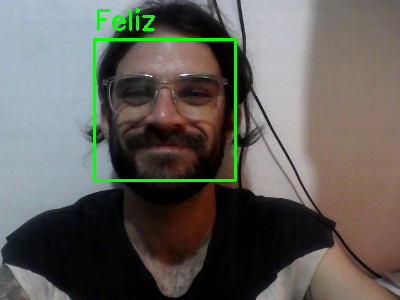

In [ ]:
imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

faces = face_detection.detectMultiScale(imagem_cinza, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

# Processar cada face detectada
for (x, y, w, h) in faces:
    # Extrair a região da face
    roi = imagem_cinza[y:y+h, x:x+w]
    # Redimensionar para o tamanho esperado pelo modelo (48x48)
    roi = cv2.resize(roi, (48, 48))
    # Converter para array e normalizar
    roi = img_to_array(roi)  # Forma: (48, 48, 1)
    roi = np.expand_dims(roi, axis=0)  # Forma: (1, 48, 48, 1)
    roi = roi / 255.0  # Normalização

    predicao = classificador_emocoes.predict(roi)[0]
    emocao = expressoes[np.argmax(predicao)]

    cv2.rectangle(imagem, (x, y), (x+w, y+h), (0, 255, 0), 2)
    cv2.putText(imagem, emocao, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

cv2_imshow(imagem)

In [ ]:
probabilidade = np.ones((255,300,3), dtype='uint8') * 255

In [ ]:
print(probabilidade)

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]


In [ ]:
probabilidade.shape

(255, 300, 3)

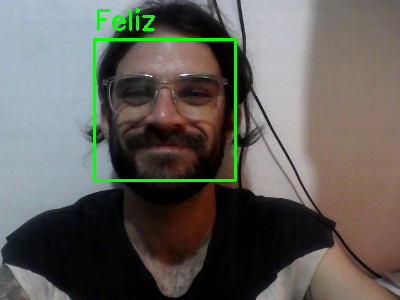

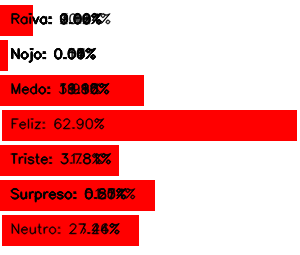

In [ ]:
cv2_imshow(imagem)
if len(faces) == 1:
    for (i, (emotion, prob)) in enumerate(zip(expressoes, predicao)):
        text = "{}: {:.2f}%".format(emotion, prob * 100)
        w = int(prob * 300)
        cv2.rectangle(probabilidade, (7, (i * 35) + 5),
                      (w, (i * 35) + 35), (0, 0, 255), -1)
        cv2.putText(probabilidade, text, (10, (i * 35) + 23), cv2.FONT_HERSHEY_SIMPLEX, 0.45, (0, 0, 0), 1, cv2.LINE_AA)
cv2_imshow(probabilidade)


# Capturando Imagem da Webcam

In [ ]:
from IPython.display import HTML, Audio
from google.colab.output import eval_js
from base64 import b64decode
import numpy as np
import io
from PIL import Image

VIDEO_HTML = """
<video autoplay
 width=%d height=%d style='cursor: pointer;'></video>
<script>

var video = document.querySelector('video')

navigator.mediaDevices.getUserMedia({ video: true })
  .then(stream=> video.srcObject = stream)

var data = new Promise(resolve=>{
  video.onclick = ()=>{
    var canvas = document.createElement('canvas')
    var [w,h] = [video.offsetWidth, video.offsetHeight]
    canvas.width = w
    canvas.height = h
    canvas.getContext('2d')
          .drawImage(video, 0, 0, w, h)
    video.srcObject.getVideoTracks()[0].stop()
    video.replaceWith(canvas)
    resolve(canvas.toDataURL('image/jpeg', %f))
  }
})
</script>
"""
def tirar_foto(filename='photo.jpg', quality=2, size=(400,300)):
  display(HTML(VIDEO_HTML % (size[0],size[1],quality)))
  data = eval_js("data")
  binary = b64decode(data.split(',')[1])
  f = io.BytesIO(binary)
  return np.asarray(Image.open(f))

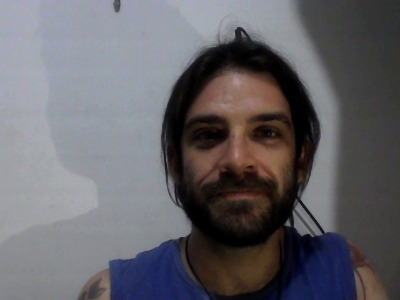

True

In [ ]:
# Clique na imagem da webcam para tirar uma foto
imagem = tirar_foto()
# Inverte a ordem dos canais (utilizar caso a imagem capturada fique com cores invertidas)
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
cv2_imshow(imagem)
cv2.imwrite("testecaptura.jpg",imagem)

# Reconhecimento de Emoções
## Seção 3 : Criando a rede neural



## Importação de  bibliotecas

In [ ]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import zipfile

cv2.__version__

'4.11.0'

In [ ]:
#!pip install tensorflow==2.17.0
import tensorflow as tf
tf.__version__

'2.18.0'

## Conexão com Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## Criação do Dataset

In [ ]:
path = "/content/gdrive/MyDrive/Material.zip"
zip_object = zipfile.ZipFile(file = path, mode = "r")
zip_object.extractall('./')
zip_object.close()

In [ ]:
base_imgs = '/content/Material/fer2013.zip'
zip_object = zipfile.ZipFile(file = base_imgs, mode = "r")
zip_object.extractall('./')
zip_object.close()

In [ ]:
data = pd.read_csv('fer2013/fer2013.csv')
data.tail()

,emotion,pixels,Usage
35882,6,50 36 17 22 23 29 33 39 34 37 37 37 39 43 48 5...,PrivateTest
35883,3,178 174 172 173 181 188 191 194 196 199 200 20...,PrivateTest
35884,0,17 17 16 23 28 22 19 17 25 26 20 24 31 19 27 9...,PrivateTest
35885,3,30 28 28 29 31 30 42 68 79 81 77 67 67 71 63 6...,PrivateTest
35886,2,19 13 14 12 13 16 21 33 50 57 71 84 97 108 122...,PrivateTest


Text(0.5, 1.0, 'Imagens x emoções')

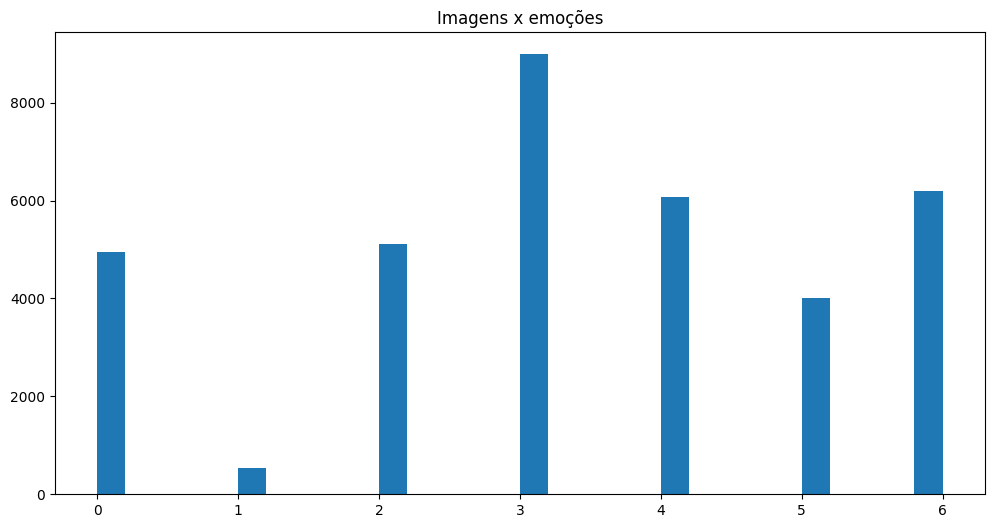

In [ ]:
plt.figure(figsize=(12,6))
plt.hist(data['emotion'], bins = 30)
plt.title('Imagens x emoções')

# Classes: ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

In [ ]:
pixels = data['pixels'].tolist()
pixels

['70 80 82 72 58 58 60 63 54 58 60 48 89 115 121 119 115 110 98 91 84 84 90 99 110 126 143 153 158 171 169 172 169 165 129 110 113 107 95 79 66 62 56 57 61 52 43 41 65 61 58 57 56 69 75 70 65 56 54 105 146 154 151 151 155 155 150 147 147 148 152 158 164 172 177 182 186 189 188 190 188 180 167 116 95 103 97 77 72 62 55 58 54 56 52 44 50 43 54 64 63 71 68 64 52 66 119 156 161 164 163 164 167 168 170 174 175 176 178 179 183 187 190 195 197 198 197 198 195 191 190 145 86 100 90 65 57 60 54 51 41 49 56 47 38 44 63 55 46 52 54 55 83 138 157 158 165 168 172 171 173 176 179 179 180 182 185 187 189 189 192 197 200 199 196 198 200 198 197 177 91 87 96 58 58 59 51 42 37 41 47 45 37 35 36 30 41 47 59 94 141 159 161 161 164 170 171 172 176 178 179 182 183 183 187 189 192 192 194 195 200 200 199 199 200 201 197 193 111 71 108 69 55 61 51 42 43 56 54 44 24 29 31 45 61 72 100 136 150 159 163 162 163 170 172 171 174 177 177 180 187 186 187 189 192 192 194 195 196 197 199 200 201 200 197 201 137 58 98 9

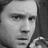

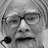

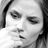

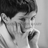

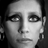

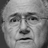

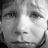

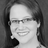

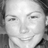

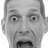

In [ ]:
largura, altura = 48, 48
faces = []
amostras = 0
for pixel_sequence in pixels:
  face = [int(pixel) for pixel in pixel_sequence.split(' ')]
  face = np.asarray(face).reshape(largura, altura)
  faces.append(face)

  if (amostras < 10):
    cv2_imshow(face)
  amostras += 1

In [ ]:
print('Número total de imagens no dataset: ', str(len(faces)))

Número total de imagens no dataset:  35887


In [ ]:
faces = np.asarray(faces)

In [ ]:
faces.shape

(35887, 48, 48)

In [ ]:
faces = np.expand_dims(faces, -1)
faces.shape

(35887, 48, 48, 1)

In [ ]:
def normalizar(x):
  x = x.astype('float32')
  x = x / 255.0
  return x

In [ ]:
faces = normalizar(faces)

In [ ]:
faces[0]

array([[[0.27450982],
        [0.3137255 ],
        [0.32156864],
        ...,
        [0.20392157],
        [0.16862746],
        [0.16078432]],

       [[0.25490198],
        [0.23921569],
        [0.22745098],
        ...,
        [0.21960784],
        [0.20392157],
        [0.17254902]],

       [[0.19607843],
        [0.16862746],
        [0.21176471],
        ...,
        [0.19215687],
        [0.21960784],
        [0.18431373]],

       ...,

       [[0.35686275],
        [0.25490198],
        [0.16470589],
        ...,
        [0.28235295],
        [0.21960784],
        [0.16862746]],

       [[0.3019608 ],
        [0.32156864],
        [0.30980393],
        ...,
        [0.4117647 ],
        [0.27450982],
        [0.18039216]],

       [[0.3019608 ],
        [0.28235295],
        [0.32941177],
        ...,
        [0.41568628],
        [0.42745098],
        [0.32156864]]], dtype=float32)

In [ ]:
emocoes = pd.get_dummies(data['emotion']).values

In [ ]:
emocoes[0]

array([ True, False, False, False, False, False, False])

## + Bibliotecas

In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras.models import model_from_json

## Split Dataset

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(faces, emocoes, test_size = 0.1, random_state = 42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = 0.1, random_state = 41)

In [ ]:
print('Número de imagens no conjunto de treinamento:', len(X_train))
print('Número de imagens no conjunto de teste:', len(X_test))
print('Número de imagens no conjunto de validação:', len(X_val))

Número de imagens no conjunto de treinamento: 29068
Número de imagens no conjunto de teste: 3589
Número de imagens no conjunto de validação: 3230


In [ ]:
np.save('mod_xtest', X_test)
np.save('mod_ytest', y_test)

## Estrutura do modelo

In [ ]:
num_features = 64
num_labels = 7
batch_size = 64
epochs = 100
width, height = 48, 48

model = Sequential()

model.add(Conv2D(num_features, kernel_size=(3,3), activation='relu',
                 input_shape=(width, height, 1), data_format = 'channels_last',
                 kernel_regularizer = l2(0.01)))
model.add(Conv2D(num_features, kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(0.5))

model.add(Conv2D(2*num_features, kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(2*num_features, kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(0.5))

model.add(Conv2D(2*2*num_features, kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(2*2*num_features, kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(0.5))

model.add(Conv2D(2*2*2*num_features, kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(2*2*2*num_features, kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(0.5))

model.add(Flatten())

model.add(Dense(2*2*2*num_features, activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(2*2*num_features, activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(2*num_features, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(num_labels, activation = 'softmax'))

model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 46, 46, 64)     │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 46, 46, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 46, 46, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 23, 23, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 23, 23, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 23, 23, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 23, 23, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 11, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 11, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 11, 11, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 11, 11, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 11, 11, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 11, 11, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 5, 5, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 5, 5, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 5, 5, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 5, 5, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 5,905,863 (22.53 MB)

 Trainable params: 5,902,151 (22.51 MB)

 Non-trainable params: 3,712 (14.50 KB)

## Compilação do modelo

In [ ]:
model.compile(loss = 'categorical_crossentropy',
              optimizer = Adam(learning_rate = 0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-7),
              metrics = ['accuracy'])

arquivo_modelo = 'modelo_01_expressoes.h5'
arquivo_modelo_json = 'modelo_01_expressoes.json'

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor = 0.9, patience=3, verbose = 1)
early_stopper = EarlyStopping(monitor='val_loss', min_delta=0, patience = 8, verbose = 1, mode = 'auto')
checkpointer = ModelCheckpoint(arquivo_modelo, monitor='val_loss', verbose = 1, save_best_only=True)

In [ ]:
model_json = model.to_json()
with open(arquivo_modelo_json, 'w') as json_file:
  json_file.write(model_json)

## Treinamento

In [ ]:
history = model.fit(np.array(X_train), np.array(y_train),
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1,
                    validation_data = (np.array(X_val), np.array(y_val)),
                    shuffle=True,
                    callbacks=[lr_reducer, early_stopper, checkpointer])

Epoch 1/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.1974 - loss: 2.2774
Epoch 1: val_loss improved from inf to 1.82829, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - accuracy: 0.1974 - loss: 2.2767 - val_accuracy: 0.2594 - val_loss: 1.8283 - learning_rate: 0.0010
Epoch 2/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.2479 - loss: 1.8410
Epoch 2: val_loss improved from 1.82829 to 1.78965, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 53s 49ms/step - accuracy: 0.2479 - loss: 1.8410 - val_accuracy: 0.2594 - val_loss: 1.7897 - learning_rate: 0.0010
Epoch 3/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.2508 - loss: 1.8184
Epoch 3: val_loss did not improve from 1.78965
455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.2508 - loss: 1.8183 - val_accuracy: 0.2594 - val_loss: 1.8162 - learning_rate: 0.0010
Epoch 4/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.2836 - loss: 1.7635
Epoch 4: val_loss improved from 1.78965 to 1.67976, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.2837 - loss: 1.7634 - val_accuracy: 0.3173 - val_loss: 1.6798 - learning_rate: 0.0010
Epoch 5/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.3347 - loss: 1.6622
Epoch 5: val_loss improved from 1.67976 to 1.58065, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step - accuracy: 0.3348 - loss: 1.6621 - val_accuracy: 0.3703 - val_loss: 1.5807 - learning_rate: 0.0010
Epoch 6/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.3859 - loss: 1.5541
Epoch 6: val_loss improved from 1.58065 to 1.53055, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.3859 - loss: 1.5541 - val_accuracy: 0.3774 - val_loss: 1.5305 - learning_rate: 0.0010
Epoch 7/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.4085 - loss: 1.4969
Epoch 7: val_loss improved from 1.53055 to 1.47033, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.4085 - loss: 1.4969 - val_accuracy: 0.4195 - val_loss: 1.4703 - learning_rate: 0.0010
Epoch 8/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.4159 - loss: 1.4627
Epoch 8: val_loss improved from 1.47033 to 1.37668, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step - accuracy: 0.4159 - loss: 1.4627 - val_accuracy: 0.4551 - val_loss: 1.3767 - learning_rate: 0.0010
Epoch 9/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.4486 - loss: 1.4126
Epoch 9: val_loss did not improve from 1.37668
455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.4486 - loss: 1.4125 - val_accuracy: 0.4483 - val_loss: 1.3917 - learning_rate: 0.0010
Epoch 10/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.4699 - loss: 1.3717
Epoch 10: val_loss improved from 1.37668 to 1.31168, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step - accuracy: 0.4700 - loss: 1.3716 - val_accuracy: 0.4839 - val_loss: 1.3117 - learning_rate: 0.0010
Epoch 11/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.4965 - loss: 1.3260
Epoch 11: val_loss improved from 1.31168 to 1.25232, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.4965 - loss: 1.3260 - val_accuracy: 0.5310 - val_loss: 1.2523 - learning_rate: 0.0010
Epoch 12/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.5136 - loss: 1.2953
Epoch 12: val_loss improved from 1.25232 to 1.24444, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step - accuracy: 0.5136 - loss: 1.2953 - val_accuracy: 0.5399 - val_loss: 1.2444 - learning_rate: 0.0010
Epoch 13/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.5177 - loss: 1.2768
Epoch 13: val_loss improved from 1.24444 to 1.18094, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5177 - loss: 1.2768 - val_accuracy: 0.5533 - val_loss: 1.1809 - learning_rate: 0.0010
Epoch 14/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.5357 - loss: 1.2332
Epoch 14: val_loss did not improve from 1.18094
455/455 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step - accuracy: 0.5357 - loss: 1.2332 - val_accuracy: 0.5625 - val_loss: 1.1848 - learning_rate: 0.0010
Epoch 15/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.5471 - loss: 1.2176
Epoch 15: val_loss improved from 1.18094 to 1.14855, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step - accuracy: 0.5471 - loss: 1.2177 - val_accuracy: 0.5628 - val_loss: 1.1486 - learning_rate: 0.0010
Epoch 16/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.5498 - loss: 1.2104
Epoch 16: val_loss did not improve from 1.14855
455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.5498 - loss: 1.2104 - val_accuracy: 0.5421 - val_loss: 1.1996 - learning_rate: 0.0010
Epoch 17/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.5688 - loss: 1.1699
Epoch 17: val_loss improved from 1.14855 to 1.12346, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - accuracy: 0.5688 - loss: 1.1699 - val_accuracy: 0.5827 - val_loss: 1.1235 - learning_rate: 0.0010
Epoch 18/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.5733 - loss: 1.1474
Epoch 18: val_loss did not improve from 1.12346
455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.5733 - loss: 1.1474 - val_accuracy: 0.5721 - val_loss: 1.1494 - learning_rate: 0.0010
Epoch 19/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.5890 - loss: 1.1162
Epoch 19: val_loss did not improve from 1.12346
455/455 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - accuracy: 0.5889 - loss: 1.1163 - val_accuracy: 0.5743 - val_loss: 1.1907 - learning_rate: 0.0010
Epoch 20/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.5981 - loss: 1.0962
Epoch 20: ReduceLROnPlateau reducing learning rate to 0.0009000000427477062.

Epoch 20: val_loss did not improve from 1.12346
455/455 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step - accuracy: 0.5981 - loss: 1.0962 - val

455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.6011 - loss: 1.0908 - val_accuracy: 0.5830 - val_loss: 1.1234 - learning_rate: 9.0000e-04
Epoch 22/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.6168 - loss: 1.0473
Epoch 22: val_loss did not improve from 1.12335
455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.6168 - loss: 1.0474 - val_accuracy: 0.5808 - val_loss: 1.1266 - learning_rate: 9.0000e-04
Epoch 23/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.6188 - loss: 1.0284
Epoch 23: val_loss improved from 1.12335 to 1.05504, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.6188 - loss: 1.0284 - val_accuracy: 0.6158 - val_loss: 1.0550 - learning_rate: 9.0000e-04
Epoch 24/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.6310 - loss: 1.0067
Epoch 24: val_loss did not improve from 1.05504
455/455 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step - accuracy: 0.6310 - loss: 1.0067 - val_accuracy: 0.6093 - val_loss: 1.0835 - learning_rate: 9.0000e-04
Epoch 25/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.6382 - loss: 1.0095
Epoch 25: val_loss did not improve from 1.05504
455/455 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - accuracy: 0.6382 - loss: 1.0095 - val_accuracy: 0.6034 - val_loss: 1.0905 - learning_rate: 9.0000e-04
Epoch 26/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.6510 - loss: 0.9664
Epoch 26: ReduceLROnPlateau reducing learning rate to 0.0008100000384729356.

Epoch 26: val_loss did not improve from 1.05504
455/455 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step - accuracy: 0.6510 - loss: 

455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.6529 - loss: 0.9533 - val_accuracy: 0.6266 - val_loss: 1.0448 - learning_rate: 8.1000e-04
Epoch 28/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.6635 - loss: 0.9213
Epoch 28: val_loss did not improve from 1.04475
455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.6635 - loss: 0.9213 - val_accuracy: 0.6176 - val_loss: 1.0565 - learning_rate: 8.1000e-04
Epoch 29/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.6685 - loss: 0.9015
Epoch 29: val_loss improved from 1.04475 to 1.02558, saving model to modelo_01_expressoes.h5


455/455 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - accuracy: 0.6685 - loss: 0.9015 - val_accuracy: 0.6288 - val_loss: 1.0256 - learning_rate: 8.1000e-04
Epoch 30/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.6832 - loss: 0.8737
Epoch 30: val_loss did not improve from 1.02558
455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.6832 - loss: 0.8738 - val_accuracy: 0.6065 - val_loss: 1.0655 - learning_rate: 8.1000e-04
Epoch 31/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.6785 - loss: 0.8854
Epoch 31: val_loss did not improve from 1.02558
455/455 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - accuracy: 0.6785 - loss: 0.8854 - val_accuracy: 0.6300 - val_loss: 1.0432 - learning_rate: 8.1000e-04
Epoch 32/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.6965 - loss: 0.8435
Epoch 32: ReduceLROnPlateau reducing learning rate to 0.0007290000503417104.

Epoch 32: val_loss did not improve from 1.02558
455/455 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.6965 - loss: 

In [ ]:
print(history.history)

{'accuracy': [0.21790285408496857, 0.24948397278785706, 0.251616895198822, 0.2938626706600189, 0.3507981300354004, 0.39149579405784607, 0.4129627048969269, 0.42510664463043213, 0.4577542245388031, 0.4768129885196686, 0.49759185314178467, 0.5098389983177185, 0.52139812707901, 0.5335420370101929, 0.5420049428939819, 0.5567290782928467, 0.5648479461669922, 0.5748245716094971, 0.5805352926254272, 0.5924383997917175, 0.6035847067832947, 0.6153157949447632, 0.6211641430854797, 0.6292486786842346, 0.638881266117096, 0.6454520225524902, 0.6542589664459229, 0.6611393690109253, 0.6687422394752502, 0.6783060431480408, 0.6794413328170776, 0.6894867420196533, 0.6964015364646912, 0.7032819390296936, 0.7164923548698425, 0.7204486131668091, 0.7281202673912048], 'loss': [1.9760737419128418, 1.8357664346694946, 1.8120914697647095, 1.7380648851394653, 1.6310666799545288, 1.5409376621246338, 1.4890964031219482, 1.4504928588867188, 1.3999474048614502, 1.361718773841858, 1.3288459777832031, 1.30229055881500

## Gráficos e avaliação do modelo

TypeError: 3.7 must be a sequence

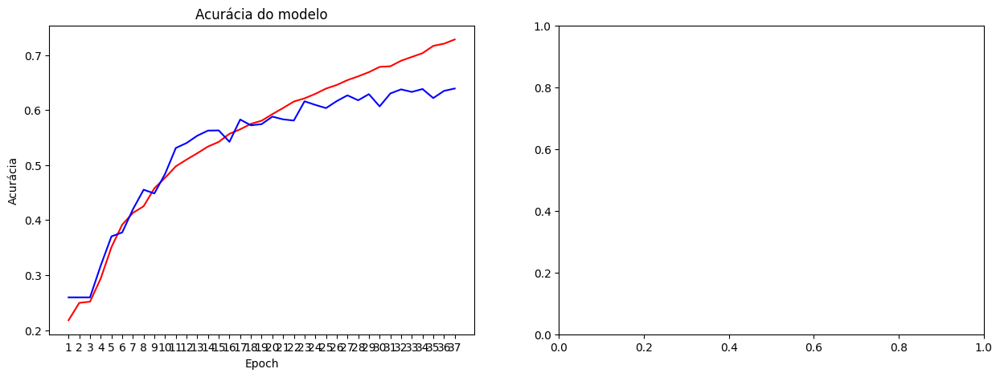

In [ ]:
def plota_historico_modelo(historico_modelo):
  fig, axs = plt.subplots(1, 2, figsize=(15,5))
  axs[0].plot(range(1, len(historico_modelo.history['accuracy']) + 1), historico_modelo.history['accuracy'], 'r')
  axs[0].plot(range(1, len(historico_modelo.history['val_accuracy']) + 1), historico_modelo.history['val_accuracy'], 'b')
  axs[0].set_title('Acurácia do modelo')
  axs[0].set_ylabel('Acurácia')
  axs[0].set_xlabel('Epoch')
  axs[0].set_xticks(np.arange(1, len(historico_modelo.history['accuracy']) + 1),
                    len(historico_modelo.history['accuracy']) / 10)
  axs[0].legend(['training accuracy', 'validation accuracy'], loc = 'best')

  axs[1].plot(range(1, len(historico_modelo.history['loss']) + 1), historico_modelo.history['loss'], 'r')
  axs[1].plot(range(1, len(historico_modelo.history['val_loss']) + 1), historico_modelo.history['val_loss'], 'b')
  axs[1].set_title('Loss do modelo')
  axs[1].set_ylabel('Loss')
  axs[1].set_xlabel('Epoch')
  axs[1].set_xticks(np.arange(1, len(historico_modelo.history['loss']) + 1),
                    len(historico_modelo.history['loss']) / 10)
  axs[1].legend(['training loss', 'validation loss'], loc = 'best')
  fig.savefig('historico_modelo_mod01.png')

plota_historico_modelo(history)

### Acurácia

In [ ]:
scores = model.evaluate(np.array(X_test), np.array(y_test), batch_size = batch_size)

57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.6336 - loss: 1.0736


In [ ]:
scores

[1.1203904151916504, 0.6249651908874512]

In [ ]:
print('Acurácia: ' + str(scores[1]))
print('Erro: ' + str(scores[0]))

Acurácia: 0.6249651908874512
Erro: 1.1203904151916504


### Matriz de confusão

In [ ]:
true_y = []
pred_y = []
x = np.load('mod_xtest.npy')
y = np.load('mod_ytest.npy')

In [ ]:
x[0]

array([[[0.5568628 ],
        [0.5803922 ],
        [0.59607846],
        ...,
        [0.3529412 ],
        [0.3529412 ],
        [0.3647059 ]],

       [[0.5568628 ],
        [0.5764706 ],
        [0.5921569 ],
        ...,
        [0.33333334],
        [0.36078432],
        [0.40392157]],

       [[0.5529412 ],
        [0.5686275 ],
        [0.5921569 ],
        ...,
        [0.3372549 ],
        [0.32156864],
        [0.37254903]],

       ...,

       [[0.0627451 ],
        [0.08235294],
        [0.07058824],
        ...,
        [0.08235294],
        [0.09019608],
        [0.11372549]],

       [[0.05490196],
        [0.0627451 ],
        [0.05490196],
        ...,
        [0.07450981],
        [0.07843138],
        [0.09803922]],

       [[0.04705882],
        [0.04705882],
        [0.04705882],
        ...,
        [0.06666667],
        [0.07450981],
        [0.09411765]]], dtype=float32)

In [ ]:
y[0]

array([False, False, False,  True, False, False, False])

In [ ]:
json_file = open(arquivo_modelo_json, 'r')
loaded_model_json = json_file.read()
json_file.close()

In [ ]:
loaded_model = model_from_json(loaded_model_json)
loaded_model.load_weights(arquivo_modelo)

In [ ]:
y_pred = loaded_model.predict(x)

113/113 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step


In [ ]:
y_pred[0]

array([1.1648349e-02, 2.8589930e-05, 1.5663225e-02, 8.6127293e-01,
       1.8356053e-02, 1.2139329e-02, 8.0891527e-02], dtype=float32)

In [ ]:
yp = y_pred.tolist()
yt = y.tolist()
count = 0

In [ ]:
len(y)

3589

In [ ]:
for i in range(len(y)):
  yy = max(yp[i])
  yyt = max(yt[i])
  pred_y.append(yp[i].index(yy))
  true_y.append(yt[i].index(yyt))
  if (yp[i].index(yy) == yt[i].index(yyt)):
    count += 1

acc = (count / len(y)) * 100

In [ ]:
print('Acurácia no conjunto de teste: ' + str(acc))

Acurácia no conjunto de teste: 61.15909724157147


In [ ]:
np.save('truey_mod01', true_y)
np.save('predy_mod01', pred_y)

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
y_true = np.load('truey_mod01.npy')
y_pred = np.load('predy_mod01.npy')

In [ ]:
cm = confusion_matrix(y_true, y_pred)
expressoes = ['Raiva', 'Nojo', 'Medo', 'Feliz', 'Triste', 'Surpreso', 'Neutro']
titulo = 'Matriz de Confusão'
print(cm)

[[285   0  22  35  92   8  56]
 [ 41   0   2   0   8   0   1]
 [105   0 131  40 170  54  45]
 [ 31   0   5 769  26  19  31]
 [ 70   0  20  38 359   1 100]
 [ 19   0  44  44   8 289  10]
 [ 41   0  15  61 127   5 362]]


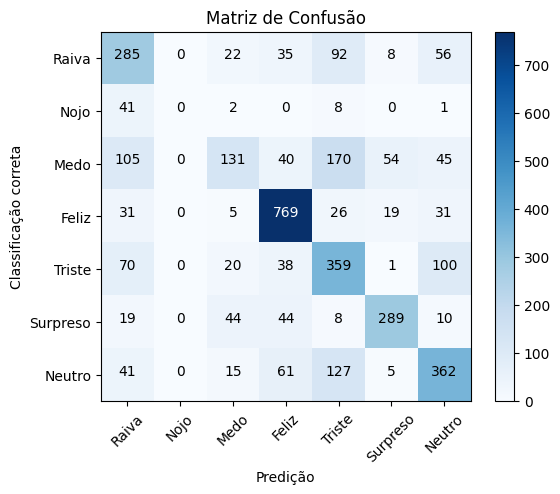

In [ ]:
import itertools
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title(titulo)
plt.colorbar()
tick_marks = np.arange(len(expressoes))
plt.xticks(tick_marks, expressoes, rotation = 45)
plt.yticks(tick_marks, expressoes)
fmt = 'd'
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
  plt.text(j, i, format(cm[i, j], fmt), horizontalalignment='center', color='white' if cm[i,j] > thresh else 'black')

plt.ylabel('Classificação correta')
plt.xlabel('Predição')
plt.savefig('matriz_confusao_mod01.png')

## Testando o modelo

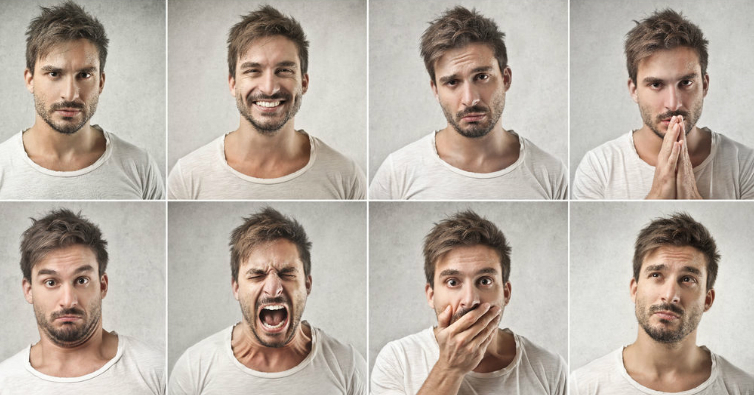

In [ ]:
imagem = cv2.imread('Material/testes/teste02.jpg')
cv2_imshow(imagem)

In [ ]:
original = imagem.copy()
gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

In [ ]:
face_cascade = cv2.CascadeClassifier('Material/haarcascade_frontalface_default.xml')
faces = face_cascade.detectMultiScale(gray, 1.1, 3)

In [ ]:
faces

array([[100,  90, 148, 148]], dtype=int32)

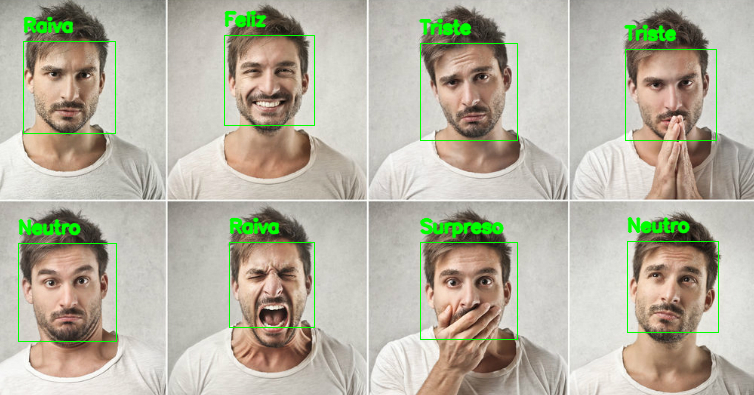

In [ ]:
for (x, y, w, h) in faces:
  cv2.rectangle(original, (x, y), (x + w, y + h), (0, 255, 0), 1)
  roi_gray = gray[y:y + h, x:x + w]
  roi_gray = roi_gray.astype('float') / 255.0
  cropped_img = np.expand_dims(np.expand_dims(cv2.resize(roi_gray, (48, 48)), -1), 0)
  prediction = loaded_model.predict(cropped_img)[0]
  cv2.putText(original, expressoes[int(np.argmax(prediction))], (x, y - 10),
              cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2, cv2.LINE_AA)

cv2_imshow(original)